# <h1><center> **Audio Visualization, Prediction and Recommendation System**</center></h1>

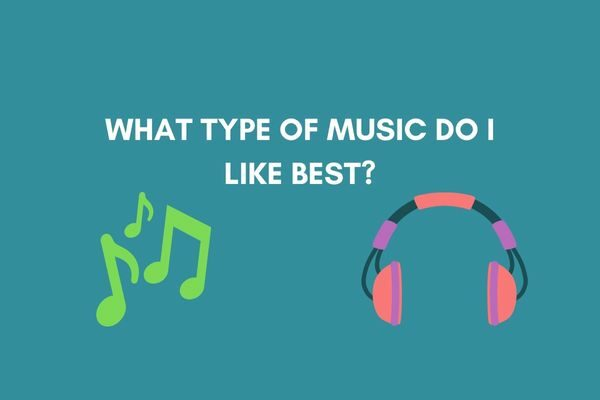

Use this channel [ValerioVelardoTheSoundofAI](https://www.youtube.com/c/ValerioVelardoTheSoundofAI) to know everything about Audio Processing, Classification, Research, Augmentation, etc.

# **Project Overview**
* Audio Visualization
* Audio Classification
* Audio Recommendation

# **It contains**
1. Dataset link
2. Importing the libraries
3. Finding all the classes in our train dataset
4. Audio Preprocessing
5. Fourier Transformation( using Short Time Fourier Transform STFT)
6. Spectrogram
7. Audio Features
8. Tempo Beats per minute
9. Spectral Centroid
10. Mel Frequency Cepstral Coefficients (MFCCs) Feature Extraction
11. Exploratory Data Analysis
12. Performing Principal Component Analysis(PCA) on all classes
13. Create the model
14. Choose the model with best accuracy
15. Predict the model
16. Create the function to predict the model
17. Feature Importance
18. Building the Recommendation System
19. Cosine similarity
20. Predicting the audio recommendations we got above.











# Dataset link:
https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification

In [2]:
#mounting the drive so that we can fetch data from google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing the libraries

* pandas is the most powerful and flexible open source data analysis/manipulation tool available in any language
* Using NumPy, mathematical and logical operations on arrays can be performed.
* Seaborn is an open-source Python library built on top of matplotlib. It is used for data visualization and exploratory data analysis. Seaborn works easily with dataframes and the Pandas library. The graphs created can also be customized easily.
* TensorFlow is an end-to-end open source platform for machine learning. It has a comprehensive, flexible ecosystem of tools, libraries and community resources that lets researchers push the state-of-the-art in ML and developers easily build and deploy ML powered applications.
* Read [sklearn](https://scikit-learn.org/stable/) docs to perform ML operations

In [5]:
# Import required libraries
import pandas as pd  # for data analysis
import numpy as np   # to solve mathematical operations
import seaborn as sns  # for data visualization
import matplotlib.pyplot as plt  # to plot different mathematical graphs and plots
import tensorflow as tf  # to perform ML processes
import sklearn   # to perform ML
%matplotlib inline


* Using **librosa** as a audio processing library.
* [**librosa**](https://librosa.org/doc/latest/core.html#module-librosa) is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

##Read this documentation for more information on librosa and better understanding of this notebook:-
* https://librosa.org/doc/latest/tutorial.html
* ipython.display - Create an audio object. When this object is returned by an input cell or passed to the display function, it will result in Audio controls being displayed in the frontend (only works in the notebook)
*

In [6]:
# Importing the librosa library
import librosa

# Import librosa.display to display audio as waves
import librosa.display

# Import IPython.display as ipd, which lets you play audio directly in an IPython notebook
import IPython.display as ipd

# Import warnings - Warnings are provided to warn the developer of situations that aren't necessarily exceptions
import warnings
warnings.filterwarnings('ignore')


In [5]:
# move to the folder where you want to store the project
%cd /content/drive/MyDrive/Audio Data

/content/drive/MyDrive/Audio Data


* Using **librosa** as a audio processing library.
* [**librosa**](https://librosa.org/doc/latest/core.html#module-librosa) is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

#Finding all the classes in our train dataset

In [7]:
# Import os module
import os

# Move to the folder where your data is stored
general_path = '/content/drive/MyDrive/Audio Data/genres_original'

# List all the classes using os.listdir
classes = os.listdir(general_path)
print(classes)

['reggae', 'rock', 'metal', 'disco', 'hiphop', 'blues', 'classical', 'jazz', 'country', 'pop']


# Audio Preprocessing

Watch this [reference](https://www.youtube.com/watch?v=Oa_d-zaUti8&ab_channel=ValerioVelardo-TheSoundofAI)
 video below:

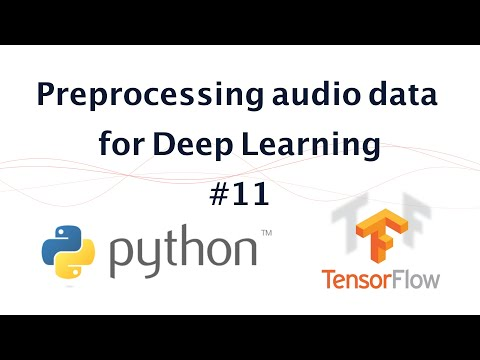

In [ ]:
from IPython.display import YouTubeVideo
YouTubeVideo('Oa_d-zaUti8', width=600, height=300)


In [7]:
# Importing 1 sample file(disco.00004.wav), for audio visualization
audio_file_path ='/content/drive/MyDrive/Audio Data/genres_original/disco/disco.00004.wav'
#  Load the audio as a waveform `y` using librosa.load
#  Store the sampling rate as `sr`
y, sr = librosa.load(audio_file_path)

# Print the waveform `y`, its shape, and the sampling rate `sr`
print("Waveform (y):", y)
print("Shape of waveform (y.shape):", y.shape)
print("Sampling rate (sr):", sr)

# Verify the length of the audio (y.shape / sampling rate)
audio_length = len(y) / sr
print("Length of audio:", audio_length, "seconds")


Waveform (y): [ 0.00262451  0.01730347 -0.01803589 ... -0.14556885 -0.1444397
 -0.03250122]
Shape of waveform (y.shape): (661794,)
Sampling rate (sr): 22050
Length of audio: 30.013333333333332 seconds


The sampling rate (often denoted as "sr") is the number of samples of audio carried per second, measured in Hertz (Hz). In digital audio, the audio waveform is sampled at discrete intervals in time. The sampling rate determines how many of these samples are taken per second.

In [8]:
ipd.Audio(y, rate=sr)

[librosa.effects.trim](https://librosa.org/doc/latest/generated/librosa.effects.trim.html#librosa.effects.trim)
* for removing noise in corner cases i.e begining and end of actual audio.

In [9]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file_trimmed, _ = librosa.effects.trim(y)

# Print the trimmed audio signal
print("Trimmed audio file:", audio_file_trimmed)

# Print the shape of the trimmed audio signal
print("Shape of trimmed audio file:", audio_file_trimmed.shape)



Trimmed audio file: [ 0.00262451  0.01730347 -0.01803589 ... -0.14556885 -0.1444397
 -0.03250122]
Shape of trimmed audio file: (661794,)


Not necessarily. The absence of silence at the beginning or end of the audio signal doesn't necessarily mean there's no voice or sound present. It simply means that there wasn't any significant amount of silence detected by the trimming function.

If the audio signal contains silence at the beginning or end, the `librosa.effects.trim` function will remove it, leaving only the portions of the signal with audible content. However, if the entire audio signal consists of silence or very low-level noise, the trimming function may not detect any significant portions to keep, resulting in a trimmed audio signal with the same length as the original.

So, in this case, the trimmed audio signal may still contain voice or sound, depending on the content of the original audio file. You would need to listen to the audio or analyze it further to determine if there is any voice present.

[librosa.display.waveplot](https://librosa.org/doc/latest/generated/librosa.display.waveplot.html#librosa.display.waveplot)
* Plot the amplitude envelope of a waveform.

* If y is monophonic, a filled curve is drawn between [-abs(y), abs(y)].

* If y is stereo, the curve is drawn between [-abs(y[1]), abs(y[0])], so that the left and right channels are drawn above and below the axis, respectively.

* Long signals (duration >= max_points) are down-sampled to at most max_sr before plotting.

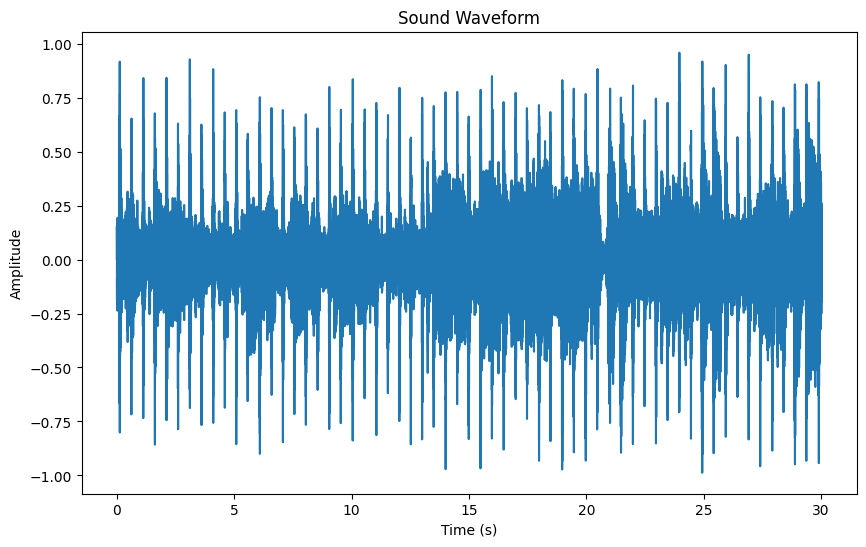

In [10]:
# Setting the time values corresponding to each sample
time = np.arange(len(y)) / sr

# Setting the graph size
plt.figure(figsize=(10, 6))

# Plotting the waveform
plt.plot(time, y)

# Adding a title to the plot
plt.title('Sound Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Displaying the plot
plt.show()

# **Fourier Transformation( using Short Time Fourier Transform STFT)**

## **1. Fourier Transform**
* Decompose complex periodic sound into sum of sine waves oscillating at
different frequencies
* From time domain to frequency domain
* No time information

<a href="https://ibb.co/SnB9xyD"><img src="https://i.ibb.co/xj6RsLK/1.jpg" alt="1" border="0"></a>

Note:- The "Fast Fourier Transform" (FFT) is an important measurement method in the science of audio and acoustics measurement. It converts a signal into individual spectral components and thereby provides frequency information about the signal.

## **2. Short-time Fourier transform (STFT)**
[Short-time Fourier transform (STFT)](http://librosa.org/doc/main/generated/librosa.stft.html).

* The STFT represents a signal in the time-frequency domain by computing discrete Fourier transforms (DFT) over short overlapping windows.
* Computes several FFT at different intervals
* Preserves time information
* Fixed frame size (e.g., 2048 samples)
* Gives a spectrogram (time + frequency + magnitude)

**Step 2**
<br>
<a href="https://ibb.co/1qNQxht"><img src="https://i.ibb.co/wWqg13F/3.jpg" alt="3" border="0"></a>

Imagine you have a piece of music, and you want to analyze how its frequencies change over time. The STFT allows you to do that by breaking the music signal into short overlapping windows and performing a Fourier Transform on each window.

Here's how it works:

Windowing: Divide the signal into small overlapping segments. For example, if your music signal is 10 seconds long, you might divide it into 1-second segments with a 50% overlap between adjacent segments.

Fourier Transform: Apply a Fourier Transform to each segment. This converts the signal from the time domain to the frequency domain, revealing the frequencies present in each segment.

Time-Frequency Representation: Stack the frequency components from each segment to create a time-frequency representation. This representation, often called a spectrogram, shows how the frequency content of the signal changes over time.

For example, let's say you have a 10-second music signal, and you divide it into 1-second segments with a 50% overlap. You then compute the Fourier Transform for each segment. If you use a fixed frame size of 2048 samples for each segment, you'll end up with several FFTs computed at different time intervals. Finally, by stacking these FFTs together, you'll get a spectrogram that shows how the frequencies in the music signal change over time.

The spectrogram will have time on the x-axis, frequency on the y-axis, and the magnitude of each frequency component represented by color intensity or grayscale. This allows you to visually analyze how different frequencies in the music signal evolve over time, providing valuable insights into the signal's characteristics.

In [11]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# set abs value of librosa.stft and pass audio_file, n_fft and hop_length (Short-time Fourier transform (STFT))
# Compute the Short-time Fourier Transform (STFT) with absolute value
D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))

# Print the shape of D
print("Shape of D:", D.shape)

Shape of D: (1025, 1293)


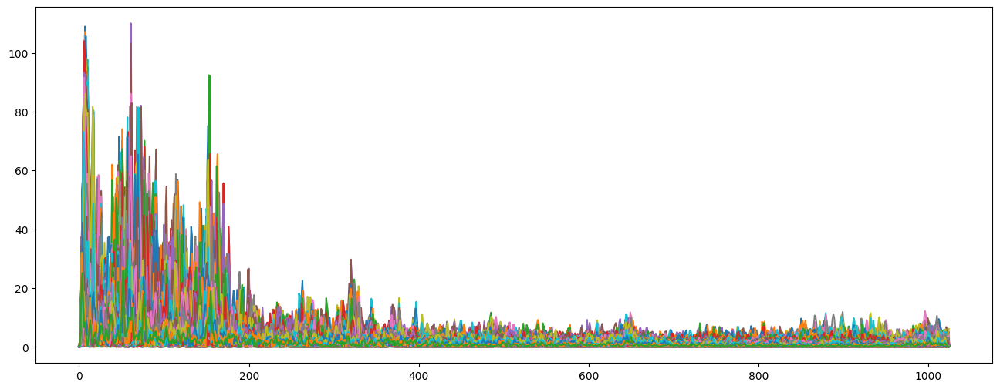

In [12]:
# plot D
plt.figure(figsize = (16, 6))
plt.plot(D);

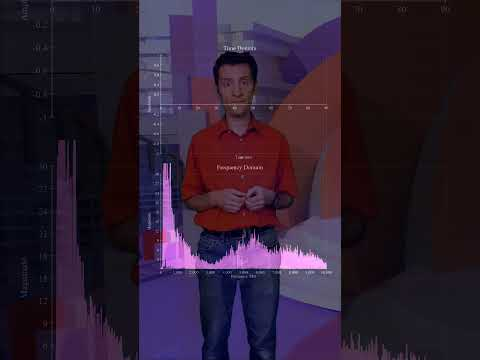

In [ ]:
YouTubeVideo('1MkU4UVBfv8', width=600, height=300)

#**Spectrogram**

A spectrogram is a visual way of representing the signal strength, or “loudness”, of a signal over time at various frequencies present in a particular waveform.

#Mel Spectrogram

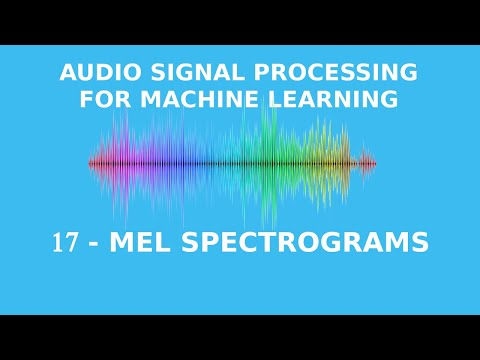

In [ ]:
YouTubeVideo('9GHCiiDLHQ4', width=600, height=300)

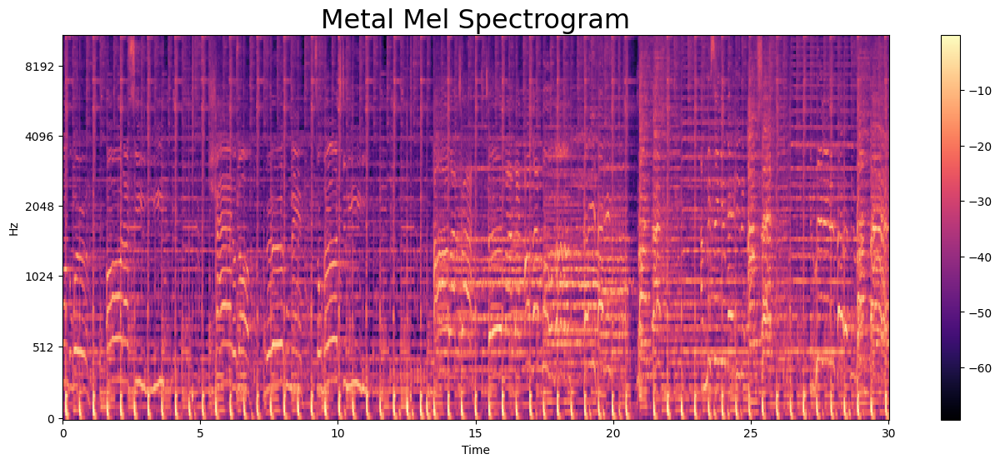

In [15]:
# Compute a mel-scaled spectrogram
S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=128)

# Convert the amplitude spectrogram to dB-scaled spectrogram
S_DB = librosa.power_to_db(S, ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(16, 6))
librosa.display.specshow(S_DB, sr=sr, x_axis='time', y_axis='mel')

# Add a colorbar
plt.colorbar()

# Add a title
plt.title("Metal Mel Spectrogram", fontsize=23)

# Show the plot
plt.show()

#Audio Features

In [22]:
# Calculate zero crossings in the song
zero_crossings = sum(librosa.zero_crossings(y))

# Print the sum of zero crossings
print("Total zero crossings in the song:", zero_crossings)

Total zero crossings in the song: 88993


Zero crossings refer to the points in an audio signal where the amplitude changes its sign, i.e., where the signal changes from positive to negative or vice versa. Calculating zero crossings can provide insights into the temporal structure and frequency content of the audio signal.

**librosa.effects.hpss(audio_file)**
<br>
This function automates the STFT->HPSS->ISTFT pipeline, and ensures that the output waveforms have equal length to the input waveform y

In audio signals, harmonic components represent sounds that have a clear pitch, such as musical notes played on instruments or sung by voices. Percussive components, on the other hand, represent sounds that have a more transient or percussive nature, such as drum hits or other non-pitched sounds.

The librosa.effects.hpss() function in Librosa separates an audio time series into its harmonic and percussive components using Harmonic-Percussive Source Separation (HPSS) technique.

Here's how you can use it to decompose an audio time series y into its harmonic (y_harm) and percussive (y_perc) components

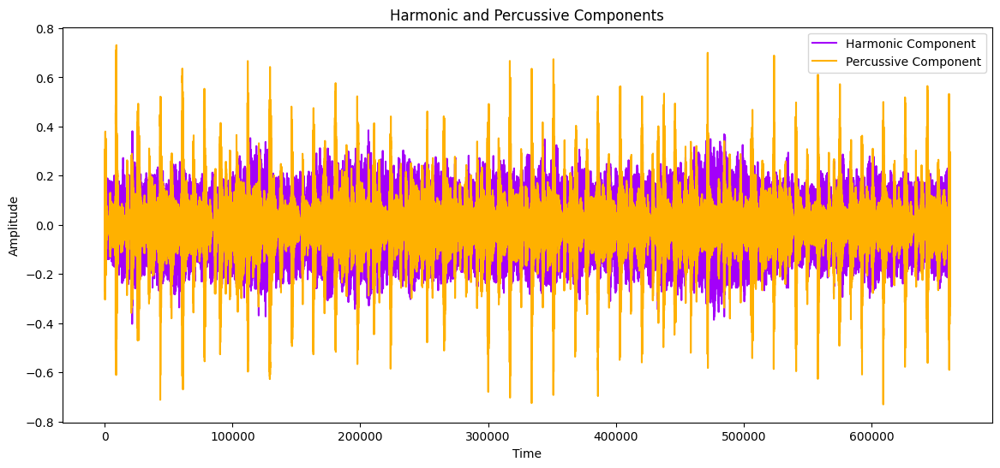

In [23]:
# Decompose the audio time series into harmonic and percussive components
y_harm, y_perc = librosa.effects.hpss(y)

# Plot the harmonic and percussive components
plt.figure(figsize=(14, 6))

plt.plot(y_harm, color='#A300F9', label='Harmonic Component')
plt.plot(y_perc, color='#FFB100', label='Percussive Component')

plt.legend()
plt.title('Harmonic and Percussive Components')
plt.xlabel('Time')
plt.ylabel('Amplitude')

plt.show()

#Tempo Beats per minute
Beats are detected in three stages, following the method of:

1. Measure onset strength

2. Estimate tempo from onset correlation

3. Pick peaks in onset strength approximately consistent with estimated tempo

Beat tracking is a fundamental task in music analysis and provides valuable information for tasks such as rhythm analysis, music synchronization, tempo estimation, and automatic music transcription. The three stages described above outline a common approach used by many beat tracking algorithms to detect the tempo and beat events in audio signals.

In [25]:
# Estimate the tempo of the audio time series
tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

# Print the estimated tempo
print("Estimated tempo:", tempo, "beats per minute")

Estimated tempo: 151.99908088235293 beats per minute


#Spectral Centroid

Calculates spectral centroids, representing the center of energy of the audio spectrum. It prints the spectral centroids and their shape, then computes the time values corresponding to each spectral centroid frame and prints them. Finally, it defines a normalization function using min-max scaling to scale data to a fixed range, enhancing uniformity and model performance.

In [26]:
# Calculate the Spectral Centroids using librosa.feature.spectral_centroid
spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]

# Print spectral_centroids
print("Spectral Centroids:", spectral_centroids)

# Print shape of spectral_centroids
print("Shape of Spectral Centroids:", spectral_centroids.shape)

# Computing the time variable for visualization
frames = range(len(spectral_centroids))

# Converts frame counts to time (seconds) using librosa.frames_to_time
t = librosa.frames_to_time(frames)

# Print frames
print("Frames:", frames)

# Print t
print("Time (s):", t)

# Define function normalize which takes data to normalize and its axis (use minmax_scale from sklearn.preprocessing)
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Spectral Centroids: [1790.19806417 1751.37442887 1699.40230202 ... 2334.18246135 2309.91209266
 2449.21847878]
Shape of Spectral Centroids: (1293,)
Frames: range(0, 1293)
Time (s): [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


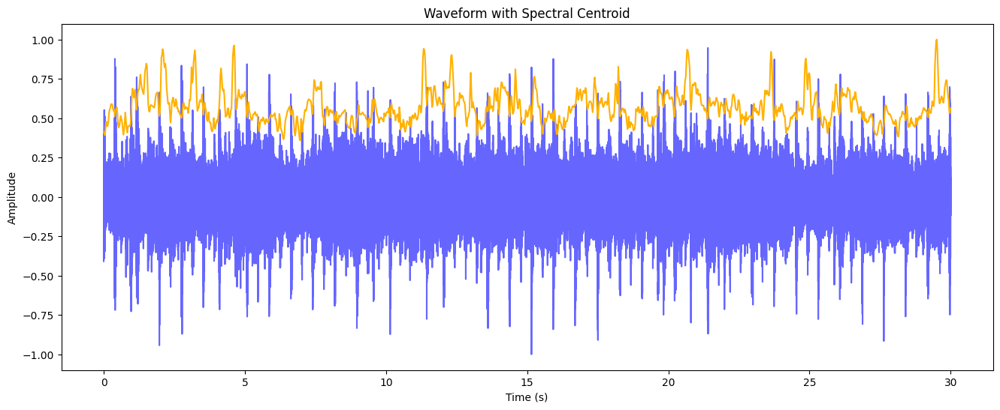

In [34]:
# Compute the Spectral Centroid
spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]

# Compute the time variable for visualization matching the length of the audio signal
t = np.linspace(0, len(y) / sr, len(y))

# Plotting the waveform along with the Spectral Centroid
plt.figure(figsize=(16, 6))

# Plot the waveform
plt.plot(t, librosa.util.normalize(y), color='blue', alpha=0.6)

# Plot the Spectral Centroid by passing t and normalize(spectral_centroids) with color '#FFB100'
t_centroids = np.linspace(0, len(y) / sr, len(spectral_centroids))
plt.plot(t_centroids, librosa.util.normalize(spectral_centroids), color='#FFB100')

# Add labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform with Spectral Centroid')

# Show the plot
plt.show()

# Mel Frequency Cepstral Coefficients (MFCCs) Feature Extraction

**Applications of MFCCs**
* Speech recognition
* Music genre classification
* Music instrument classification

**Properties of MFCCs**
* Capture timbral/textural aspects of sound
* Frequency domain feature
* Approximate human auditory system
* 13 to 40 coefficients
* Calculated at each frame

Mel Frequency Cepstral Coefficients (MFCCs) are a widely used feature extraction technique in audio signal processing. Here's a brief overview of their applications, properties, and how they are used in analysis:

Applications:

Speech recognition: MFCCs are particularly useful in speech recognition tasks due to their ability to capture the essential characteristics of speech signals.
Music genre classification: MFCCs can be employed to distinguish different music genres based on their timbral characteristics.
Music instrument classification: They are also used in identifying musical instruments based on their spectral properties.
Properties:

Capture timbral/textural aspects of sound: MFCCs are effective in capturing the timbral qualities of audio signals, which are crucial for various audio analysis tasks.
Frequency domain feature: They are derived from the frequency domain representation of audio signals, making them well-suited for analyzing spectral characteristics.
Approximate human auditory system: MFCCs are designed to mimic certain properties of the human auditory system, making them more perceptually relevant for tasks like speech and music analysis.
Number of coefficients: Typically, MFCCs consist of 13 to 40 coefficients, although the number can vary based on the specific application and desired level of detail.
Calculated at each frame: MFCCs are computed for short-time frames of audio signals, typically overlapping windows, to capture the temporal dynamics of the sound.
Analysis:

Discriminative features: MFCCs provide a compact yet informative representation of audio signals, making them useful for tasks that involve discriminating between different sounds or classes.
Noise-robust features: Due to their focus on capturing spectral characteristics, MFCCs can be relatively robust to noise and other distortions in audio signals, enhancing the performance of various analysis tasks in noisy environments.
Feature vectors: Once computed, MFCCs form feature vectors that can be fed into machine learning algorithms for further analysis, such as classification or clustering.

In summary, MFCCs are versatile features that are widely used in various audio analysis tasks, including speech recognition, music genre classification, and instrument identification. Their ability to capture essential spectral and timbral characteristics of audio signals makes them a cornerstone in the field of audio signal processing.

<a href="https://ibb.co/BsGXxWw"><img src="https://i.ibb.co/kcJRfbM/4.jpg" alt="4" border="0"></a>

For learning more on Feature extraction for audio read https://librosa.org/doc/latest/feature.html

Shape of MFCCs: (20, 1293)


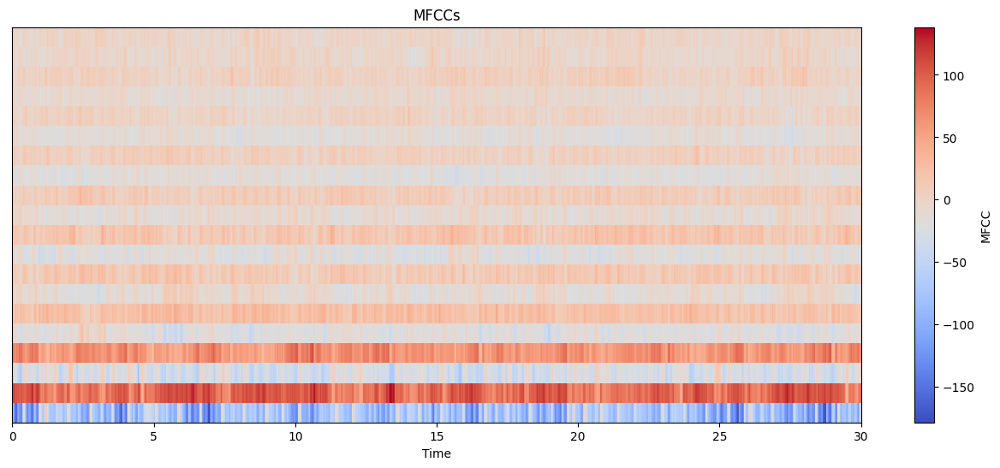

In [38]:
# Compute the MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr)

# Print the shape of mfccs
print("Shape of MFCCs:", mfccs.shape)

# Displaying the MFCCs
plt.figure(figsize=(16, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

# Add colorbar and title
plt.colorbar(label='MFCC')
plt.title('MFCCs')

# Show the plot
plt.show()

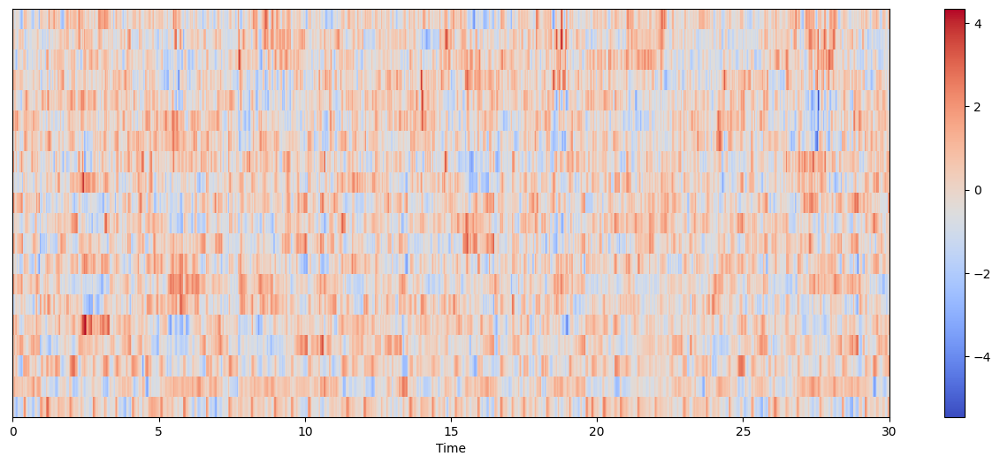

In [39]:
from sklearn import preprocessing

# Perform feature scaling using preprocessing.scale
mfccs_scaled = preprocessing.scale(mfccs, axis=1)

# Finding the mean of mfccs
mean_mfccs = np.mean(mfccs, axis=1)

# Finding the variance of mfccs
var_mfccs = np.var(mfccs, axis=1)

# Setting the figure size
plt.figure(figsize=(16, 6))

# Displaying the MFCCs using specshow
librosa.display.specshow(mfccs_scaled, sr=sr, x_axis='time')

# Adding colorbar
plt.colorbar()

# Show the plot
plt.show()

#**Exploratory Data Analysis**

In [12]:
# Read the CSV file
data = pd.read_csv(f'/content/drive/MyDrive/Audio Data/features_30_sec.csv')

# Check the top 5 rows of the DataFrame
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [15]:
data.tail(100)

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
900,rock.00000.wav,661794,0.387577,0.085947,0.129127,0.005176,1996.327664,253317.046573,2097.080528,96097.543570,...,72.018906,-7.954800,35.664963,2.088888,32.998192,-2.400473,30.493656,-1.545837,57.983974,rock
901,rock.00001.wav,661794,0.365396,0.092115,0.180470,0.004920,1529.474961,226975.980892,1845.614892,118302.876157,...,28.202349,-4.949003,38.247959,-1.478706,38.036983,0.093757,31.638021,-5.355480,37.853733,rock
902,rock.00002.wav,661794,0.436806,0.086603,0.148662,0.006555,1875.315631,469319.088058,1983.973789,168248.258342,...,32.975990,-2.236184,46.028484,1.050915,48.065933,-1.652950,32.407761,-0.040473,31.185984,rock
903,rock.00003.wav,661794,0.379949,0.098387,0.151299,0.003987,1421.445980,428116.802500,1902.678467,172163.198782,...,28.271057,-2.437564,33.099937,-0.724597,33.062683,-1.420623,39.440090,0.652951,35.974148,rock
904,rock.00004.wav,661794,0.372798,0.089463,0.208739,0.001812,1345.693061,476303.495413,1841.674809,166605.306248,...,37.788227,-5.316258,46.373756,-0.845729,43.074821,-4.655758,27.223850,-4.789689,27.622538,rock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,rock.00095.wav,661794,0.352063,0.080487,0.079486,0.000345,2008.149458,282174.689224,2106.541053,88609.749506,...,45.050526,-13.289984,41.754955,2.484145,36.778877,-6.713265,54.866825,-1.193787,49.950665,rock
996,rock.00096.wav,661794,0.398687,0.075086,0.076458,0.000588,2006.843354,182114.709510,2068.942009,82426.016726,...,33.851742,-10.848309,39.395096,1.881229,32.010040,-7.461491,39.196327,-2.795338,31.773624,rock
997,rock.00097.wav,661794,0.432142,0.075268,0.081651,0.000322,2077.526598,231657.968040,1927.293153,74717.124394,...,33.597008,-12.845291,36.367264,3.440978,36.001110,-12.588070,42.502201,-2.106337,29.865515,rock
998,rock.00098.wav,661794,0.362485,0.091506,0.083860,0.001211,1398.699344,240318.731073,1818.450280,109090.207161,...,46.324894,-4.416050,43.583942,1.556207,34.331261,-5.041897,47.227180,-3.590644,41.299088,rock


In [16]:
data.shape

(1000, 60)

# Lets Create a Correlation HeatMap

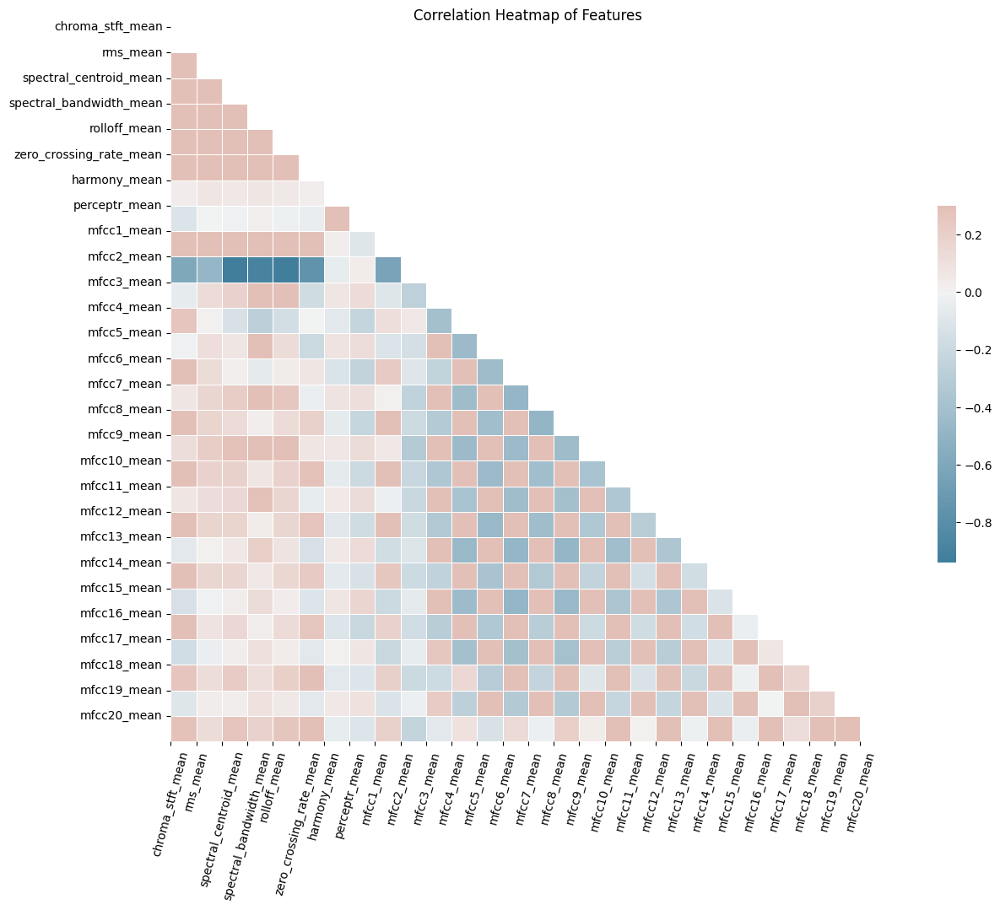

In [45]:
import numpy as np
import seaborn as sns

# Select columns containing 'mean'
spike_cols = [col for col in data.columns if 'mean' in col]

# Compute correlation matrix
corr = data[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Add title to the plot
plt.title('Correlation Heatmap of Features')

# Set x-axis tick locations and labels
ax.set_xticks(np.arange(len(spike_cols)))
ax.set_xticklabels(spike_cols, rotation=75)

# Set y-axis tick locations and labels
ax.set_yticks(np.arange(len(spike_cols)))
ax.set_yticklabels(spike_cols, rotation=0)

# Save the figure
plt.savefig("Corr_Heatmap.jpg")

# Show the plot
plt.show()

### Lets make a boxplot based on our classes

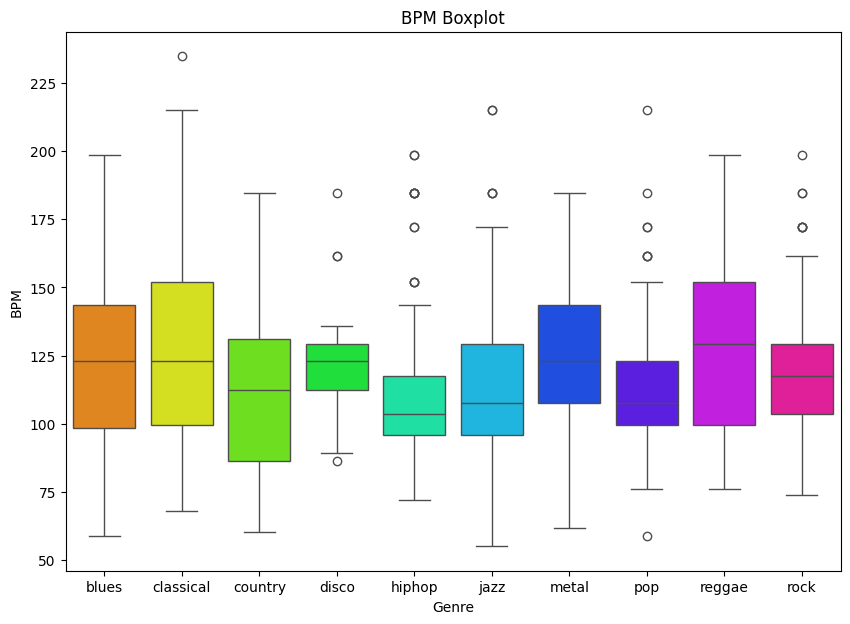

In [58]:
# Plot subplots
f, ax = plt.subplots(figsize=(10, 7))

# Define a color palette for the box plot
palette = sns.color_palette("hsv", len(data['label'].unique()))

# Plotting the boxplot
sns.boxplot(data=data, x='label', y='tempo', ax=ax, palette=palette)

# Adding title to the plot
plt.title('BPM Boxplot')

# Setting x-axis tick labels
ax.set_xlabel('Genre')

# Setting y-axis label
ax.set_ylabel('BPM')

# Saving the figure
plt.savefig("BPM_Boxplot.jpg")

# Show the plot
plt.show()

In [48]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# Taking all rows and columns from the 1st using iloc
data = data.iloc[:, 1:]

# Set the output feature "label" as y
y = data["label"]

# Remove label from dataframe as we want to predict the label
X = data.drop(columns=["label"])

# Get the column names of X
cols = X.columns

# Normalize using MinMaxScaler
min_max_scaler = MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns=cols)

# PCA with 2 components
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)

# Create a dataframe with 2 columns ['principal component 1', 'principal component 2']
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# Concatenate with target label
finalDf = pd.concat([principalDf, y], axis=1)

# Print explained_variance_ratio
print("Explained Variance Ratio:", pca.explained_variance_ratio_)

Explained Variance Ratio: [0.24644968 0.22028192]


In this case, the output [0.24644968 0.22028192] means that the first principal component explains approximately 24.64% of the variance in the data, while the second principal component explains approximately 22.03% of the variance.

Together, these two principal components explain around 46.67% of the total variance in the data.

Understanding the explained variance ratio is essential in PCA as it helps assess how much information is retained by reducing the dimensionality of the data. In this example, while reducing the dimensionality to 2 components, about 46.67% of the total variance is preserved.








## Performing Principal Component Analysis(PCA) on all classes

Read more about matplotlib.pyplot from below

* https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot

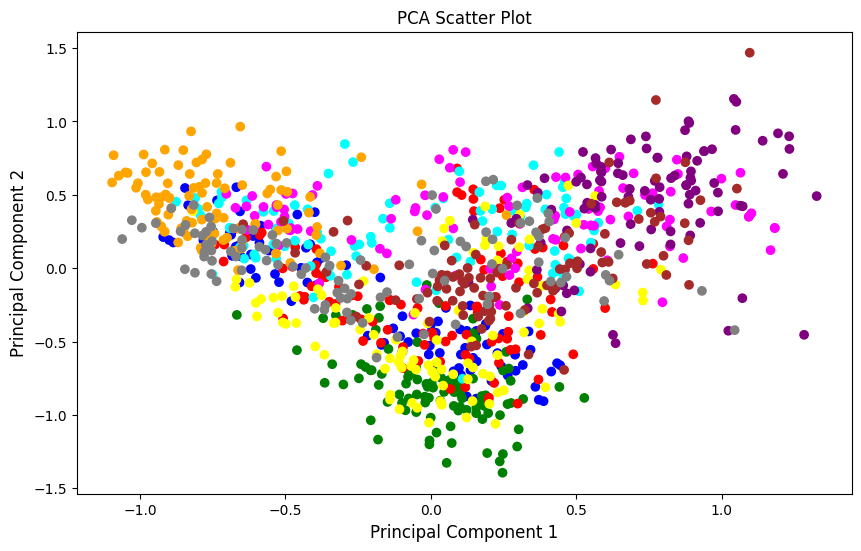

In [51]:
# Set the colormap
colors = {'blues': 'blue', 'classical': 'green', 'country': 'red', 'disco': 'cyan',
          'hiphop': 'magenta', 'jazz': 'yellow', 'metal': 'orange', 'pop': 'purple',
          'reggae': 'brown', 'rock': 'gray'}

# Plot the figure
plt.figure(figsize=(10, 6))

# Plot the scatter plot using principal components
plt.scatter(finalDf['principal component 1'], finalDf['principal component 2'],
            c=finalDf['label'].map(colors), cmap='viridis')

# Set the title of the graph
plt.title('PCA Scatter Plot')

# Set x-axis tick locations and labels
plt.xticks(fontsize=10)

# Set y-axis tick locations and labels
plt.yticks(fontsize=10)

# Plot the label for x-axis
plt.xlabel('Principal Component 1', fontsize=12)

# Plot the label for y-axis
plt.ylabel('Principal Component 2', fontsize=12)

# Save the figure
plt.savefig("PCA_Scatter.jpg")

# Show the plot
plt.show()

These values indicate how much of the variance in the original dataset is captured by each principal component for that particular sample. The position of the point in the scatter plot provides insights into the relationship between the samples based on their principal component values. Points that are close together in the plot may share similar patterns or characteristics in their original feature space.

#### Import all the classifier models that we are going to use.
#### Import sklearn libraries for measuring accuracy, confusion matrix, auc scores.

# Read these docs to know more about these libraries

* https://scikit-learn.org/stable/modules/neighbors.html#classification

* https://scikit-learn.org/stable/modules/tree.html#tree

* https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

* https://scikit-learn.org/stable/modules/sgd.html#sgd

* https://scikit-learn.org/stable/modules/svm.html#svm-classification

* https://scikit-learn.org/stable/modules/feature_selection.html#rfe



In [8]:
# To perform online updates to model parameters via partial_fit
from sklearn.naive_bayes import GaussianNB

# Importing classifiers
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier

# For plotting decision trees and feature importance
from xgboost import plot_tree, plot_importance

# For evaluating model performance
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve

# For data preprocessing
from sklearn import preprocessing

# For splitting data into train and test sets
from sklearn.model_selection import train_test_split

# For feature selection
from sklearn.feature_selection import RFE

In [20]:
# Read the CSV file
data = pd.read_csv(f'/content/drive/MyDrive/Audio Data/features_3_sec.csv')

# Choose all rows and columns from the first to the last using iloc
data = data.iloc[:, :]

# Display the first 5 rows
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [21]:
data.tail(100)

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
9890,rock.00090.0.wav,66149,0.366085,0.089511,0.112359,0.000787,2413.734634,536642.914340,2251.903033,47492.032416,...,101.561180,-2.768304,84.418617,5.539509,120.055038,-1.512484,87.898994,8.194673,151.847290,rock
9891,rock.00090.1.wav,66149,0.261564,0.093118,0.112408,0.000631,2707.808738,341565.742924,2397.881559,22494.748922,...,443.406708,19.882135,237.456940,20.580439,112.967407,-2.578947,171.911758,0.240802,227.216309,rock
9892,rock.00090.2.wav,66149,0.242911,0.092378,0.110785,0.000585,3148.389553,331989.076578,2425.119563,29400.603919,...,100.570274,19.197784,126.466904,33.858047,108.358063,18.817728,271.891327,8.816348,193.984741,rock
9893,rock.00090.3.wav,66149,0.295485,0.096420,0.143967,0.001439,2535.047905,248845.227841,2314.218180,47946.123707,...,75.833878,-0.024678,82.069412,9.586541,137.473801,-4.871718,182.629761,-0.587323,106.465584,rock
9894,rock.00090.4.wav,66149,0.215873,0.093934,0.177132,0.000288,2425.963806,155287.947454,2151.850532,37744.919762,...,90.564133,2.118019,52.513432,6.484994,52.409023,-9.263505,57.501434,-4.043235,135.397980,rock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,rock.00099.5.wav,66149,0.349126,0.080515,0.050019,0.000097,1499.083005,164266.886443,1718.707215,85931.574523,...,42.485981,-9.094270,38.326839,-4.246976,31.049839,-5.625813,48.804092,1.818823,38.966969,rock
9986,rock.00099.6.wav,66149,0.372564,0.082626,0.057897,0.000088,1847.965128,281054.935973,1906.468492,99727.037054,...,32.415203,-12.375726,66.418587,-3.081278,54.414265,-11.960546,63.452255,0.428857,18.697033,rock
9987,rock.00099.7.wav,66149,0.347481,0.089019,0.052403,0.000701,1346.157659,662956.246325,1561.859087,138762.841945,...,78.228149,-2.524483,21.778994,4.809936,25.980829,1.775686,48.582378,-0.299545,41.586990,rock
9988,rock.00099.8.wav,66149,0.387527,0.084815,0.066430,0.000320,2084.515327,203891.039161,2018.366254,22860.992562,...,28.323744,-5.363541,17.209942,6.462601,21.442928,2.354765,24.843613,0.675824,12.787750,rock


In [22]:
data.shape

(9990, 60)

In [32]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode the class labels
y_encoded = label_encoder.fit_transform(y)   #for XGBOOST its compulsory to convert y to int

y = y_encoded

# Remove non-numeric columns from the DataFrame
X = data.select_dtypes(include=[np.number])

cols = X.columns
# Initialize MinMaxScaler
min_max_scaler = MinMaxScaler()

# Fit and transform the scaler to the numeric data
np_scaled = min_max_scaler.fit_transform(numeric_data)


# New DataFrame with the new scaled data
X = pd.DataFrame(np_scaled, columns=cols)

# Display the top 5 rows
X.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,...,0.363613,0.056198,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781
1,0.0,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,...,0.468596,0.092912,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548
2,0.0,0.373159,0.728067,0.296753,0.141663,0.265293,0.023073,0.494051,0.059922,0.378215,...,0.479681,0.096704,0.420979,0.050639,0.400536,0.067509,0.433742,0.043841,0.546264,0.036062
3,0.0,0.399349,0.677066,0.298024,0.075042,0.238427,0.023187,0.455246,0.066234,0.329587,...,0.386258,0.067995,0.387474,0.050617,0.380430,0.050030,0.405824,0.041898,0.562204,0.034873
4,0.0,0.355668,0.689113,0.322308,0.052149,0.233460,0.016451,0.451651,0.047830,0.318453,...,0.438567,0.042500,0.460314,0.083860,0.388590,0.076524,0.409019,0.020763,0.517913,0.031713


In [33]:
# splitting the data into train and test set with test_size=0.3, random_state=42
from sklearn.model_selection import train_test_split

# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Display the shapes of the resulting datasets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (6993, 58)
Shape of X_test: (2997, 58)
Shape of y_train: (6993,)
Shape of y_test: (2997,)


Read [this](https://www.tensorflow.org/api_docs/python/tf/keras/Model#fit) article to know more about model fitting and predictions

# **Create a function to fit, predict and print the accuracy of model**

In [34]:
from sklearn.metrics import accuracy_score

def model_assess(model, title="Default"):
    # Fit the model
    model.fit(X_train, y_train)

    # Predict
    preds = model.predict(X_test)

    # Print the accuracy
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')

In [35]:
# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier()
model_assess(sgd, "Stochastic Gradient Descent")

# KNN
knn = KNeighborsClassifier()
model_assess(knn, "K-Nearest Neighbors")

# Decision Trees
tree = DecisionTreeClassifier()
model_assess(tree, "Decision Trees")

# Random Forest
rforest = RandomForestClassifier()
model_assess(rforest, "Random Forest")

# Support Vector Machine
svm = SVC()
model_assess(svm, "Support Vector Machine")

# Logistic Regression
lg = LogisticRegression()
model_assess(lg, "Logistic Regression")

# Neural Nets
nn = MLPClassifier()
model_assess(nn, "Neural Networks")

# XGBoost
xgb = XGBClassifier()
model_assess(xgb, "XGBoost")

# XGBoost (Random Forest)
xgbrf = XGBRFClassifier()
model_assess(xgbrf, "XGBoost (Random Forest)")

Accuracy Naive Bayes : 0.51952 

Accuracy Stochastic Gradient Descent : 0.64031 

Accuracy K-Nearest Neighbors : 0.88989 

Accuracy Decision Trees : 0.65199 

Accuracy Random Forest : 0.86186 

Accuracy Support Vector Machine : 0.75409 

Accuracy Logistic Regression : 0.6977 

Accuracy Neural Networks : 0.75642 

Accuracy XGBoost : 0.89623 

Accuracy XGBoost (Random Forest) : 0.74708 



# **Choose the model with best accuracy from above models**

### **Here best model we got is Cross Gradient Booster with an accuracy of 89.623%**

Accuracy : 0.89623 



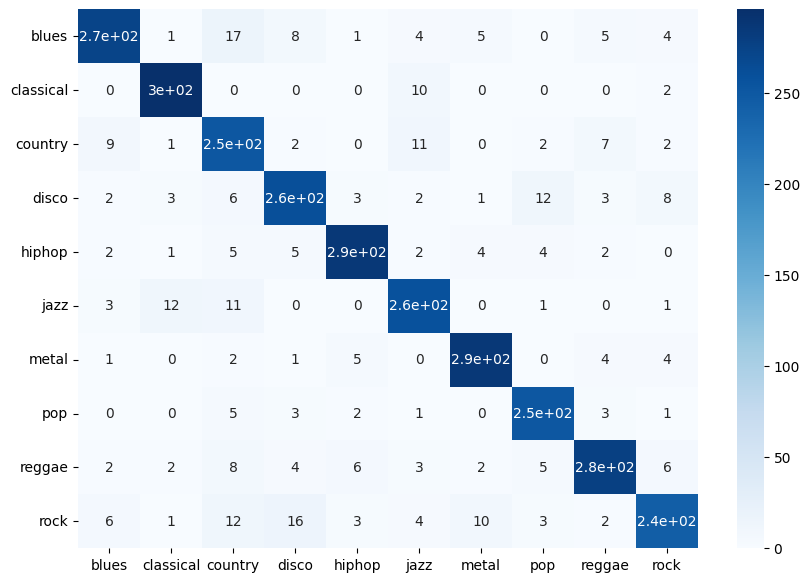

In [36]:
# Final model
xgb = XGBClassifier()

# Fit the model
xgb.fit(X_train, y_train)

# Predict
preds = xgb.predict(X_test)

# Print the accuracy
print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')

# Confusion Matrix
confusion_matr = confusion_matrix(y_test, preds)

# Plot the figure with size 10x7
plt.figure(figsize=(10, 7))

# Plot the confusion matrix
sns.heatmap(confusion_matr, cmap="Blues", annot=True,
            xticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
            yticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"])

# Save the confusion matrix
plt.savefig("confusion_matrix.png")

# **Save the model as txt, json and pkl file**

In [38]:
import pickle

# Saving the model in JSON format using save_model method
xgb.save_model("xgb_model.json")

# Saving the model in txt format
xgb_model_txt = xgb.get_booster().get_dump()
with open("xgb_model.txt", "w") as f:
    for tree in xgb_model_txt:
        f.write(tree)

# Saving the model in pickle format
file_name = "xgb.pkl"
with open(file_name, 'wb') as f:
    pickle.dump(xgb, f)

# **loading the model**

In [39]:
# Load the model from the pickle file
with open(file_name, 'rb') as f:
    xgb_model = pickle.load(f)

In [40]:
# Check first row of dataframe X
first_row = X.iloc[0]
first_row

length                     0.000000
chroma_stft_mean           0.355399
chroma_stft_var            0.716757
rms_mean                   0.293133
rms_var                    0.107955
spectral_centroid_mean     0.262173
spectral_centroid_var      0.034784
spectral_bandwidth_mean    0.459205
spectral_bandwidth_var     0.094130
rolloff_mean               0.346153
rolloff_var                0.083164
zero_crossing_rate_mean    0.204458
zero_crossing_rate_var     0.008479
harmony_mean               0.627798
harmony_var                0.065750
perceptr_mean              0.558889
perceptr_var               0.094009
tempo                      0.398969
mfcc1_mean                 0.705797
mfcc1_var                  0.053666
mfcc2_mean                 0.520907
mfcc2_var                  0.049058
mfcc3_mean                 0.436564
mfcc3_var                  0.087325
mfcc4_mean                 0.612386
mfcc4_var                  0.077451
mfcc5_mean                 0.442464
mfcc5_var                  0

In [41]:
# check first 10 output of y_test
first_10_y_test = y_test[:10]
print(first_10_y_test)

[4 5 0 0 6 9 7 2 2 0]


'blues': 0,
    'classical': 1,
    'country': 2,
    'disco': 3,
    'hiphop': 4,
    'jazz': 5,
    'metal': 6,
    'pop': 7,
    'reggae': 8,
    'rock': 9

# **Predicting the model**

In [43]:
# Predict the label for the 4th input in X_test
pred = xgb_model.predict(X_test.iloc[[3]])
print(pred)

[0]


#**Feature Importance**
* Training a model that accurately predicts outcomes is great, but most of the time you don't just need predictions, you want to be able to interpret your model.
* For example, if you build a model of house prices, knowing which features are most predictive of price tells us which features people are willing to pay for.
* Feature importance is the most useful interpretation tool, and data scientists regularly examine model parameters (such as the coefficients of linear models), to identify important features.
* Read this article on [Default Random forest importances](https://explained.ai/rf-importance/)

[eli5.permutation_importance](https://eli5.readthedocs.io/en/latest/autodocs/permutation_importance.html)

A module for computing feature importances by measuring how score decreases when a feature is not available. It contains basic building blocks; there is a full-featured sklearn-compatible implementation in PermutationImportance.

In [51]:
# install eli5 library
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=7197785597d29c6a9b31c3bff3e761c1257283ed06d832f3baa7271c680ae443
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


Go through this article for Permutation Importance:-  

https://www.kaggle.com/dansbecker/permutation-importance

* The ELI5 permutation importance takes a much more direct path of determining which features are important against a specific test set by systematically removing them (or more accurately, replacing them with random noise)
and measuring how this affects the model’s performance.  
* It works with both classification and regression models.

In [52]:
import eli5
from eli5.sklearn import PermutationImportance

In [53]:
# Instantiate PermutationImportance with estimator=xgb_model and random_state=1
perm = PermutationImportance(estimator=xgb_model, random_state=1)

# Fit the test data
perm.fit(X_test, y_test)

# Return an explanation of estimator parameters as an HTML object
eli5.show_weights(perm)

Weight,Feature
0.1245 ± 0.0099,x16
0.0450 ± 0.0044,x24
0.0410 ± 0.0049,x15
0.0366 ± 0.0088,x1
0.0334 ± 0.0080,x13
0.0259 ± 0.0018,x4
0.0252 ± 0.0057,x14
0.0232 ± 0.0037,x34
0.0202 ± 0.0032,x28
0.0180 ± 0.0026,x17


# **Building the Recommendation System**

In [54]:
from IPython.display import Audio
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing

In [55]:
# Read data f'{general_path}/features_30_sec.csv', index_col='filename'
data = pd.read_csv(f'/content/drive/MyDrive/Audio Data/features_30_sec.csv', index_col='filename')

In [57]:
# Extract labels
labels = data['label']

# Drop columns=['length','label'] from original dataframe
data.drop(columns=['length','label'], inplace=True)

# Display the top 5 rows of the dataframe
data.head()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,...,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035
blues.00001.wav,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,...,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282
blues.00002.wav,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,...,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025
blues.00003.wav,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,...,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339
blues.00004.wav,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,...,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160


[sklearn.preprocessing.scale](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing)

* Standardize a dataset along any axis.
* Center to the mean and component wise scale to unit variance.

In [58]:
from sklearn.preprocessing import MinMaxScaler

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the data
data_scaled = scaler.fit_transform(data)

# Print the data type of data_scaled
print(type(data_scaled))

<class 'numpy.ndarray'>


# **Cosine similarity**

[Cosine similarity](https://en.wikipedia.org/wiki/Cosine_similarity)
* It measures the similarity between two vectors of an inner product space.
* It is measured by the cosine of the angle between two vectors and determines whether two vectors are pointing in roughly the same direction.
* It is often used to measure document similarity in text analysis.




**Read this [article](https://neo4j.com/docs/graph-data-science/current/alpha-algorithms/cosine/#:~:text=Cosine%20similarity%20is%20the%20cosine,'%20lengths%20(or%20magnitudes)) before moving ahead:-**<br>


In [59]:
from sklearn.metrics.pairwise import cosine_similarity

# Instantiate Cosine similarity and pass data_scaled
similarity = cosine_similarity(data_scaled)

# Print the similarity shape
print("Shape of similarity matrix:", similarity.shape)

# Convert similarity matrix into a DataFrame
sim_df_labels = pd.DataFrame(similarity, columns=data.index, index=data.index)

# Set the index as labels.index
sim_df_names = sim_df_labels.copy()

# Set column names as labels.index
sim_df_names.columns = data.index

# Display top 5 rows
sim_df_names.head()

Shape of similarity matrix: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.959573,0.978391,0.956588,0.934156,0.860451,0.815598,0.874823,0.978383,0.939222,...,0.914424,0.938123,0.927471,0.976140,0.935340,0.970284,0.968042,0.952863,0.962610,0.971555
blues.00001.wav,0.959573,1.000000,0.936921,0.970325,0.929243,0.913341,0.867707,0.921504,0.949041,0.957551,...,0.882608,0.866094,0.839981,0.925943,0.863246,0.931348,0.911170,0.893739,0.972113,0.962886
blues.00002.wav,0.978391,0.936921,1.000000,0.943602,0.947531,0.860638,0.818793,0.884296,0.961056,0.918375,...,0.905663,0.936522,0.923695,0.963643,0.926934,0.953503,0.955009,0.954085,0.942775,0.961379
blues.00003.wav,0.956588,0.970325,0.943602,1.000000,0.913509,0.885014,0.866055,0.905108,0.948823,0.943092,...,0.845244,0.847369,0.825500,0.918789,0.845398,0.911080,0.904484,0.884267,0.966290,0.947419
blues.00004.wav,0.934156,0.929243,0.947531,0.913509,1.000000,0.932252,0.875027,0.927696,0.911203,0.952079,...,0.897434,0.861716,0.846580,0.900826,0.848643,0.895034,0.886522,0.892237,0.912356,0.918657


In [60]:
def find_similar_songs(name):
    # Find songs most similar to another song using sim_df_names[name].sort_values method
    series = sim_df_names[name].sort_values(ascending=False)

    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series[series.index != name]

    # Display the 5 top matches
    print("\n\n We recommend you these songs based on your previous likings and input", name)
    print("\n ")
    # Print top 5 songs on the recommendation list i.e. top 5 most similar songs
    print(series.head(5))

In [61]:
# Enter the song name which you want to get recommendation for (ex pop.00003.wav), use find_similar_song function
song_name = "pop.00003.wav"

# Use find_similar_songs function to get recommendations
find_similar_songs(song_name)





 We recommend you these songs based on your previous likings and input pop.00003.wav

 
filename
hiphop.00059.wav     0.970700
reggae.00067.wav     0.968278
reggae.00042.wav     0.964378
pop.00010.wav        0.964121
country.00044.wav    0.963992
Name: pop.00003.wav, dtype: float64


In [62]:
# We want to find the recommendation for this song input
ipd.Audio(f'/content/drive/MyDrive/Audio Data/genres_original/pop/pop.00003.wav')

## Predicting the audio recommendations we got above.

In [65]:
# lets check the recommendations we got.
# recommendation-1
ipd.Audio(f'/content/drive/MyDrive/Audio Data/genres_original/hiphop/hiphop.00059.wav')

In [66]:
# lets check the recommendations we got.
# recommendation-2
ipd.Audio(f'/content/drive/MyDrive/Audio Data/genres_original/reggae/reggae.00067.wav')

In [69]:
# lets check the recommendations we got.
# recommendation-3
ipd.Audio('/content/drive/MyDrive/Audio Data/genres_original/reggae/reggae.00042.wav')

In [71]:
# lets check the recommendations we got.
# recommendation-4
ipd.Audio(f'/content/drive/MyDrive/Audio Data/genres_original/pop/pop.00010.wav')